In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
pd.set_option('mode.chained_assignment',  None)
import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv("./data/housing.csv")
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [3]:
df=pd.read_csv("/content/drive/MyDrive/housing.csv")
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [4]:
df.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
ocean_proximity        object
dtype: object

In [5]:
df.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [6]:
#drop the row which has null value
df = df.dropna(axis = 0)
df.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

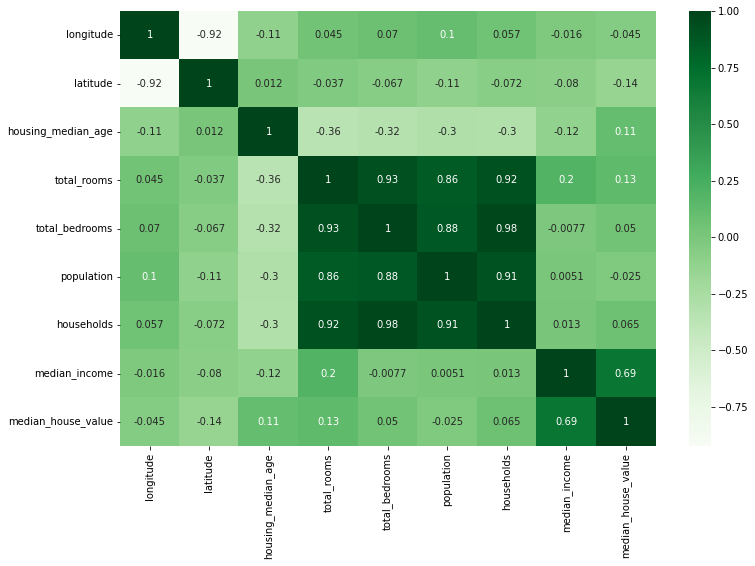

In [7]:
corr = df.corr()
plt.figure(figsize=(12,8))
sns.heatmap(corr, cmap="Greens",annot=True)

In [65]:
#To take highly correlated features
corr_df=corr.unstack()
corr_df=pd.DataFrame(corr_df[corr_df<1].sort_values(ascending=False),columns=['corr'])
corr_set=[['households','total_bedrooms','total_rooms','population'],['median_income','total_bedrooms','total_rooms','population']]
corr_set2=['median_income','total_bedrooms','total_rooms','population']
corr_df

,,corr
households,total_bedrooms,0.979728
total_bedrooms,households,0.979728
total_rooms,total_bedrooms,0.930380
total_bedrooms,total_rooms,0.930380
households,total_rooms,0.918992
...,...,...
housing_median_age,total_bedrooms,-0.320451
total_rooms,housing_median_age,-0.360628
housing_median_age,total_rooms,-0.360628
latitude,longitude,-0.924616


In [12]:
#scaler - MinMax, Standard, Robust
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
#encoder - Label encoding, onehot encoding, replace()
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

In [13]:
# devide features scalable and encodable
scalableDf = df.drop(['ocean_proximity'], axis=1)
encodableDf = df[['ocean_proximity']]

In [14]:
df['ocean_proximity'].unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

In [15]:
#use standardScaler
st_scaler = StandardScaler()
st_scaler.fit(scalableDf)
st_scaledDf = st_scaler.transform(scalableDf)
st_scaledDf = pd.DataFrame(st_scaledDf)
st_scaledDf.columns = ['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value']
print(st_scaledDf)

       longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0      -1.327314  1.051717            0.982163    -0.803813       -0.970325   
1      -1.322323  1.042355           -0.606210     2.042130        1.348276   
2      -1.332305  1.037674            1.855769    -0.535189       -0.825561   
3      -1.337296  1.037674            1.855769    -0.623510       -0.718768   
4      -1.337296  1.037674            1.855769    -0.461970       -0.611974   
...          ...       ...                 ...          ...             ...   
20428  -0.758318  1.800677           -0.288535    -0.444580       -0.388895   
20429  -0.818212  1.805358           -0.844466    -0.887557       -0.920488   
20430  -0.823203  1.777272           -0.923885    -0.175042       -0.125472   
20431  -0.873115  1.777272           -0.844466    -0.355344       -0.305834   
20432  -0.833186  1.749186           -1.003304     0.067955        0.185416   

       population  households  median_income  media

In [16]:
#use robust scaler
rb_scaler = RobustScaler()
rb_scaler.fit(scalableDf)
rb_scaledDf = rb_scaler.transform(scalableDf)
rb_scaledDf = pd.DataFrame(rb_scaledDf)
rb_scaledDf.columns = ['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value']
print(rb_scaledDf)

       longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0      -0.986807  0.955145            0.631579    -0.736562       -0.871795   
1      -0.984169  0.949868           -0.421053     2.936799        1.911681   
2      -0.989446  0.947230            1.210526    -0.389841       -0.698006   
3      -0.992084  0.947230            1.210526    -0.503839       -0.569801   
4      -0.992084  0.947230            1.210526    -0.295334       -0.441595   
...          ...       ...                 ...          ...             ...   
20428  -0.686016  1.377309           -0.210526    -0.272888       -0.173789   
20429  -0.717678  1.379947           -0.578947    -0.844654       -0.811966   
20430  -0.720317  1.364116           -0.631579     0.075015        0.142450   
20431  -0.746702  1.364116           -0.578947    -0.157708       -0.074074   
20432  -0.725594  1.348285           -0.684211     0.388659        0.515670   

       population  households  median_income  media

In [17]:
#use minmax scaler
minmax_scaler = MinMaxScaler()
minmax_scaler.fit(scalableDf)
minmax_scaledDf = minmax_scaler.transform(scalableDf)
minmax_scaledDf = pd.DataFrame(minmax_scaledDf)
minmax_scaledDf.columns = ['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value']
print(minmax_scaledDf)

       longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0       0.211155  0.567481            0.784314     0.022331        0.019863   
1       0.212151  0.565356            0.392157     0.180503        0.171477   
2       0.210159  0.564293            1.000000     0.037260        0.029330   
3       0.209163  0.564293            1.000000     0.032352        0.036313   
4       0.209163  0.564293            1.000000     0.041330        0.043296   
...          ...       ...                 ...          ...             ...   
20428   0.324701  0.737513            0.470588     0.042296        0.057883   
20429   0.312749  0.738576            0.333333     0.017676        0.023122   
20430   0.311753  0.732200            0.313725     0.057277        0.075109   
20431   0.301793  0.732200            0.333333     0.047256        0.063315   
20432   0.309761  0.725824            0.294118     0.070782        0.095438   

       population  households  median_income  media

In [18]:
#use label encoder
label_encoder = LabelEncoder()
label_encoder.fit(encodableDf)
label_encodedDf = label_encoder.transform(encodableDf)
label_encodedDf = pd.DataFrame(label_encodedDf)
print(label_encodedDf)

       0
0      3
1      3
2      3
3      3
4      3
...   ..
20428  1
20429  1
20430  1
20431  1
20432  1

[20433 rows x 1 columns]


In [19]:
#use one hot encoder
onehot_encoder = OneHotEncoder()
onehot_encoder.fit(encodableDf)
onehot_encodedDf = onehot_encoder.transform(encodableDf)
onehot_encodedDf = onehot_encodedDf.toarray()
onehot_encodedDf = pd.DataFrame(onehot_encodedDf)
print(onehot_encodedDf)

         0    1    2    3    4
0      0.0  0.0  0.0  1.0  0.0
1      0.0  0.0  0.0  1.0  0.0
2      0.0  0.0  0.0  1.0  0.0
3      0.0  0.0  0.0  1.0  0.0
4      0.0  0.0  0.0  1.0  0.0
...    ...  ...  ...  ...  ...
20428  0.0  1.0  0.0  0.0  0.0
20429  0.0  1.0  0.0  0.0  0.0
20430  0.0  1.0  0.0  0.0  0.0
20431  0.0  1.0  0.0  0.0  0.0
20432  0.0  1.0  0.0  0.0  0.0

[20433 rows x 5 columns]


In [20]:
#merege scaled df and encoded df
def mergeDf(scaledDf, encodedDf):
    mergedDf= pd.concat([scaledDf, encodedDf], axis=1)
    return mergedDf

In [21]:
st_onehot_df = pd.concat([st_scaledDf, onehot_encodedDf], axis=1)
st_label_df = pd.concat([st_scaledDf, label_encodedDf], axis=1)
rb_onehot_df = pd.concat([rb_scaledDf, onehot_encodedDf], axis=1)
rb_label_df = pd.concat([rb_scaledDf, label_encodedDf], axis=1)
minmax_onehot_df = pd.concat([minmax_scaledDf, onehot_encodedDf], axis=1)
minmax_label_df = pd.concat([minmax_scaledDf, label_encodedDf], axis=1)
scaling_method=[st_onehot_df,st_label_df,rb_onehot_df,rb_label_df,minmax_onehot_df,minmax_label_df]

In [28]:
# #feature engineering
engineeredDf = st_onehot_df[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population']]

In [38]:
from sklearn.cluster import KMeans
def kmeans(df, k):
    dfcopy = df.copy()
    kmeans = KMeans(n_clusters=k, random_state = 10).fit(dfcopy)
    pred = kmeans.predict(dfcopy)
    centers = kmeans.cluster_centers_
    dfcopy['cluster_id'] = kmeans.labels_
    print(pd.DataFrame(centers))
    print(pred[:10])
    plt.figure(figsize=(20,6))
    X = dfcopy
    plt.subplot(131)
    sns.scatterplot(x=X.iloc[:,0], y=X.iloc[:,1], data=dfcopy, hue=kmeans.labels_, palette='coolwarm')
    plt.scatter(centers[:,0], centers[:,1], c='black', alpha=0.8, s=150)

    plt.subplot(132)
    sns.scatterplot(x=X.iloc[:,0], y=X.iloc[:,2], data=dfcopy, hue=kmeans.labels_, palette='coolwarm')
    plt.scatter(centers[:,0], centers[:,2], c='black', alpha=0.8, s=150)

    plt.subplot(133)
    sns.scatterplot(x=X.iloc[:,0], y=X.iloc[:,3], data=dfcopy, hue=kmeans.labels_, palette='coolwarm')
    plt.scatter(centers[:,0], centers[:,3], c='black', alpha=0.8, s=150)

    plt.show()
    
    return kmeans.labels_
    


In [87]:
def visualize_cluster_plot(clusterobj, dataframe, label_name, iscenter=True):
    
    # sort of cluster values
    unique_labels = np.unique(dataframe[label_name].values)
    
    markers=['o', 's', '^', 'x', '*', 'v', '>', '<', '1', '+']


    for label in unique_labels:
        # dataframe by the cluster
        label_cluster = dataframe[dataframe[label_name]==label]
        cluster_legend = 'Cluster '+str(label)
        
        # visualize the cluster
        plt.scatter(x=label_cluster['housing_median_age'], y=label_cluster['total_bedrooms'], s=70,
                    edgecolor='k', marker=markers[label], label=cluster_legend)
            
        legend_loc='upper right'
    
    plt.legend(loc=legend_loc)
    plt.show()

In [88]:
from sklearn.mixture import GaussianMixture
def gmm(df, k):
    dfcopy = df.copy()
    gmm = GaussianMixture(n_components=k, random_state=11)
    gmm_labels = gmm.fit_predict(dfcopy)
    dfcopy['cluster_id'] = gmm_labels
    
    #visualization
    visualize_cluster_plot(gmm, dfcopy, 'cluster_id', iscenter = False)

    return gmm_labels
    

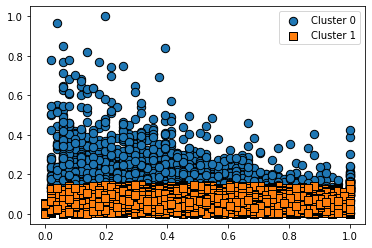

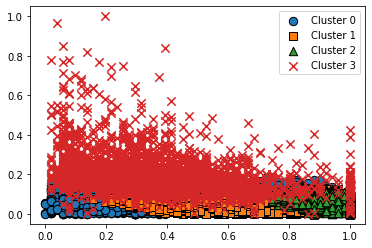

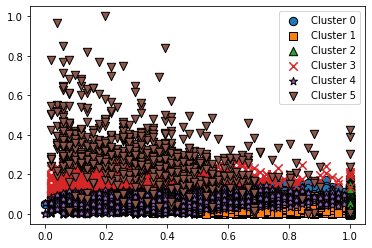

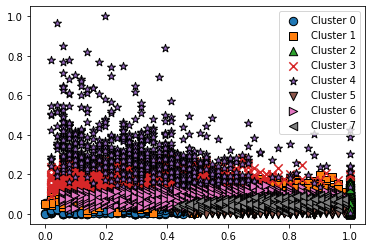

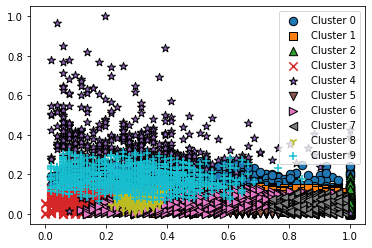

In [72]:
for i in range(2,12,2):
    gmm(engineeredDf, i)
  

#dbscan

In [119]:
from sklearn.cluster import DBSCAN
def dbScan(df, k, eps):
    dfcopy = df.copy()
    dbscan = DBSCAN(eps=eps, min_samples = k)
    dfcopy['cluster_id']=dbscan.fit_predict(dfcopy)
    print(dfcopy['cluster_id'])
    
    #visualization
    plt.figure(figsize = (8, 8))
    #interate until the maximum cluster number
    for i in range(-1, dfcopy['cluster_id'].max() + 1):
        plt.scatter(dfcopy.loc[dfcopy['cluster_id'] == i, 'housing_median_age'], dfcopy.loc[dfcopy['cluster_id'] == i, 'total_bedrooms'], 
                        label = 'cluster_id' + str(i))

    plt.legend()
    plt.title('eps = '+str(eps)+', min_samples = '+str(k), size = 15)
    plt.xlabel('housing_median_age', size = 12)
    plt.ylabel('total_bedrooms', size = 12)
    plt.show()
    
    return dbscan.labels_
    

0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


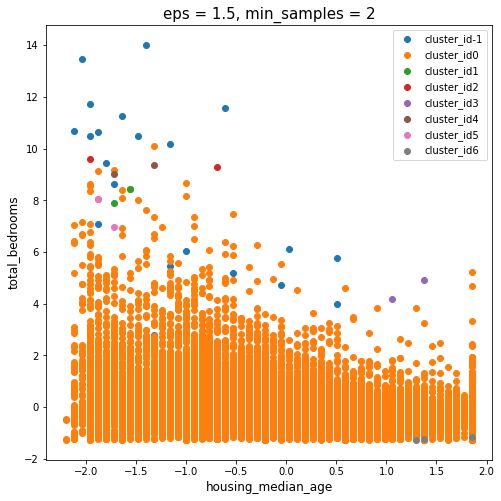

0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


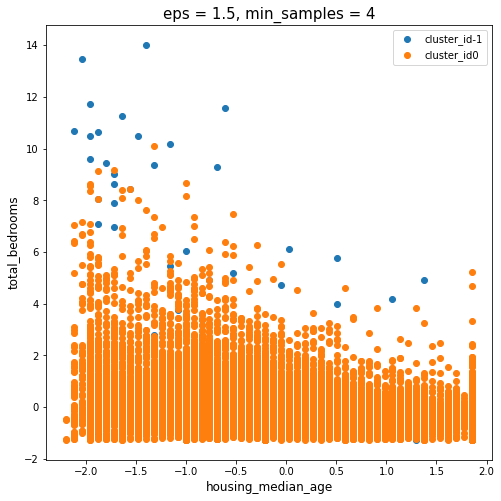

0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


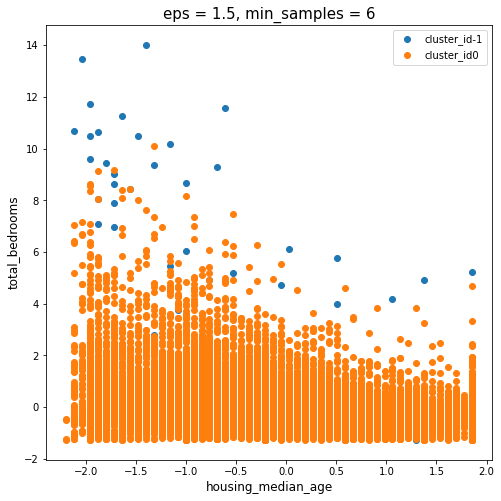

0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


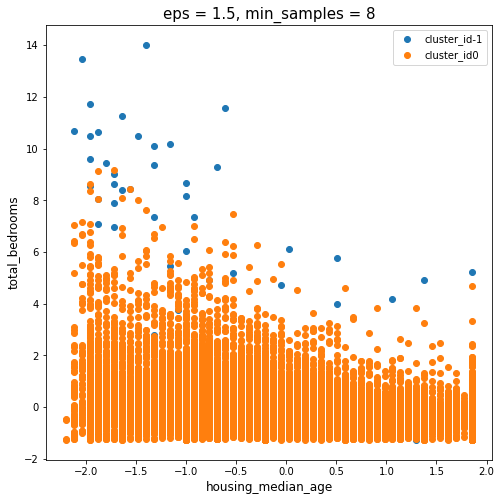

0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


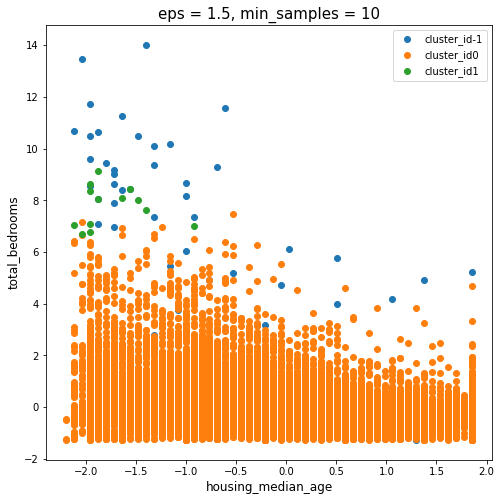

In [107]:
for i in range(2,12,2):
    dbScan(engineeredDf,i,1.5)

In [ ]:
from pyclustering.cluster.clarans import clarans
def clarans(df, k):
    dfcopy = df.copy()
    clarans_instance=clarans(dfcopy,k)
    (tks, res) = timedcall(clarans_obj.process)
    print("Execution time : ", tks, "\n")
    clst = clarans_obj.get_clusters()
    med = clarans_obj.get_medoids()


In [ ]:
clarans(engineeredDf, 5)

RecursionError: maximum recursion depth exceeded while calling a Python object

#validataion

In [121]:
from sklearn.metrics import silhouette_samples, silhouette_score
def silhouette(df):
    average_score=silhouette_score(df,df['cluster_id'])
    return average_score

          0         1         2         3
0 -0.923000  1.962537  2.018020  1.879039
1  0.119028 -0.253084 -0.260239 -0.242316
[1 0 1 1 1 1 1 1 1 1]


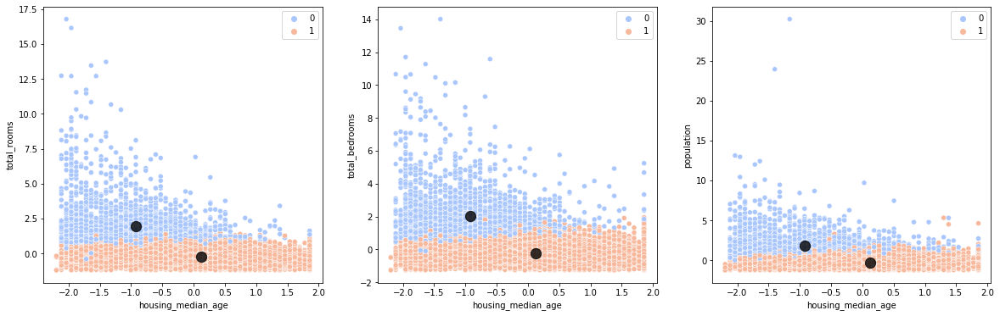

standard and onehot, 
silhouette score of k= 2 is 0.38848162439049433



          0         1         2         3
0 -0.923000  1.962537  2.018020  1.879039
1  0.119028 -0.253084 -0.260239 -0.242316
[1 0 1 1 1 1 1 1 1 1]


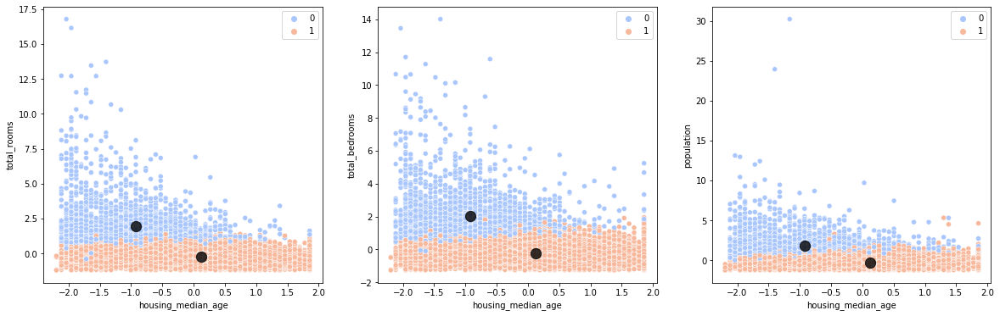

standard and label, 
silhouette score of k= 2 is 0.3604509417336215



          0         1         2         3
0  0.046768 -0.006278  0.000099  0.000992
1 -0.605810  3.027817  2.893498  2.726282
[0 1 0 0 0 0 0 0 0 0]


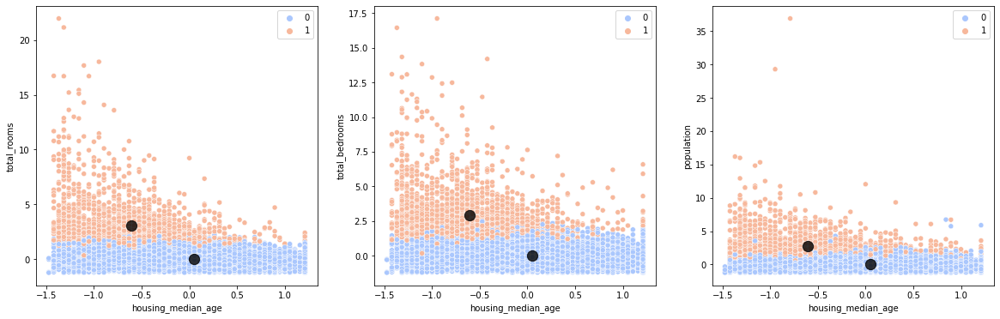

robust and onehot, 
silhouette score of k= 2 is 0.5223938375505546



          0         1         2         3
0  0.046768 -0.006278  0.000099  0.000992
1 -0.605810  3.027817  2.893498  2.726282
[0 1 0 0 0 0 0 0 0 0]


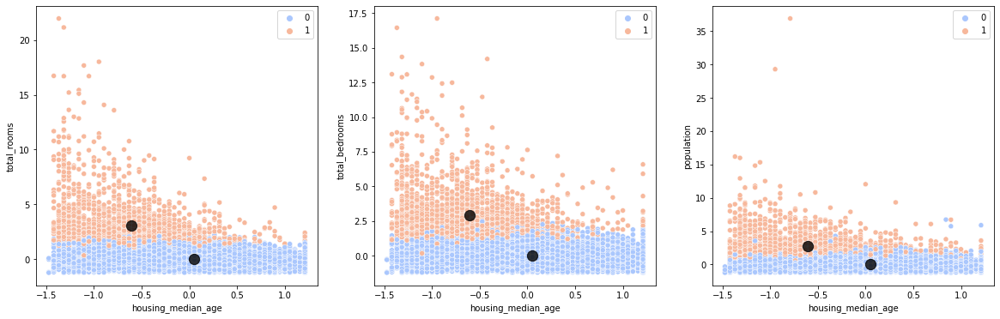

robust and label, 
silhouette score of k= 2 is 0.48704914635104124



          0         1         2         3
0  0.333631  0.084569  0.102360  0.047862
1  0.747569  0.049647  0.064491  0.031940
[1 0 1 1 1 1 1 1 1 1]


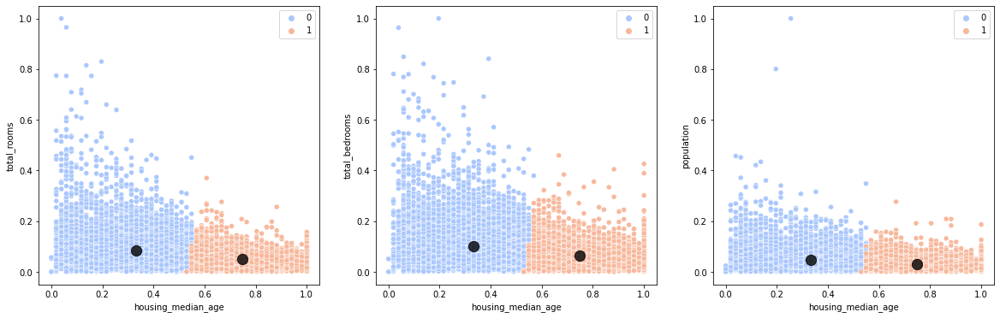

minmax and onehot, 
silhouette score of k= 2 is 0.2899524494088949



          0         1         2         3
0  0.333631  0.084569  0.102360  0.047862
1  0.747569  0.049647  0.064491  0.031940
[1 0 1 1 1 1 1 1 1 1]


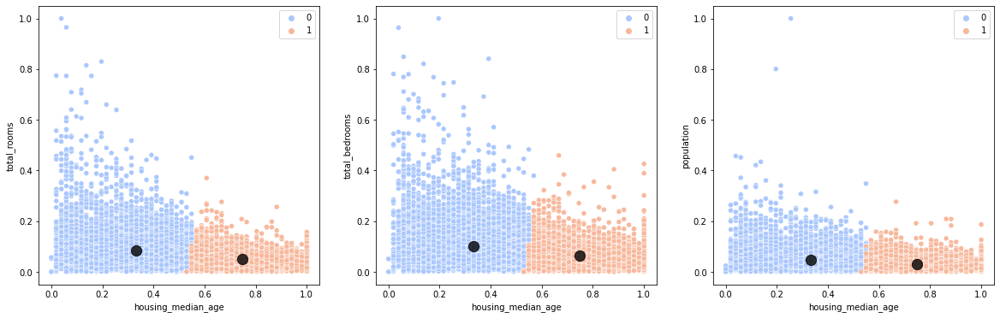

minmax and label, 
silhouette score of k= 2 is 0.22473506607578803



          0         1         2         3
0 -0.731999 -0.185574 -0.221446 -0.228316
1  0.895659 -0.406495 -0.401480 -0.361932
2 -0.687042  1.194529  1.293477  1.208733
3 -1.362096  5.346005  5.095282  4.923554
[1 2 1 1 1 1 1 1 1 1]


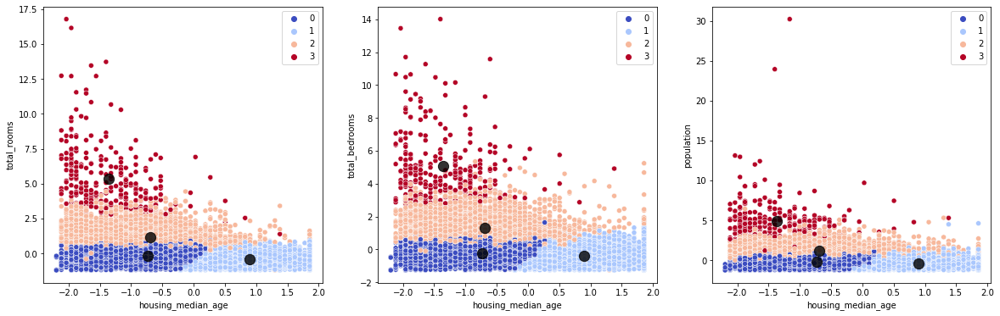

standard and onehot, 
silhouette score of k= 4 is 0.17003809426410862



          0         1         2         3
0 -0.731999 -0.185574 -0.221446 -0.228316
1  0.895659 -0.406495 -0.401480 -0.361932
2 -0.687042  1.194529  1.293477  1.208733
3 -1.362096  5.346005  5.095282  4.923554
[1 2 1 1 1 1 1 1 1 1]


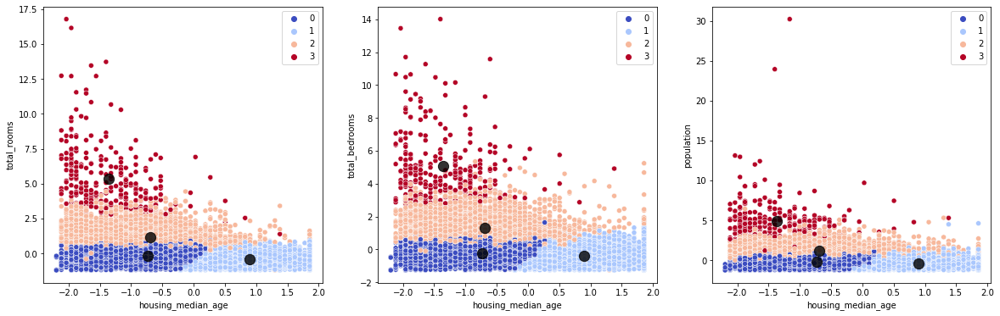

standard and label, 
silhouette score of k= 4 is 0.15063412966997972



          0         1         2         3
0  0.184502 -0.338672 -0.336305 -0.329048
1 -0.233491  0.688838  0.706671  0.690665
2 -0.600621  2.774652  2.699646  2.496977
3 -0.960388  8.307402  7.256395  7.179488
[0 2 0 0 0 0 0 1 1 1]


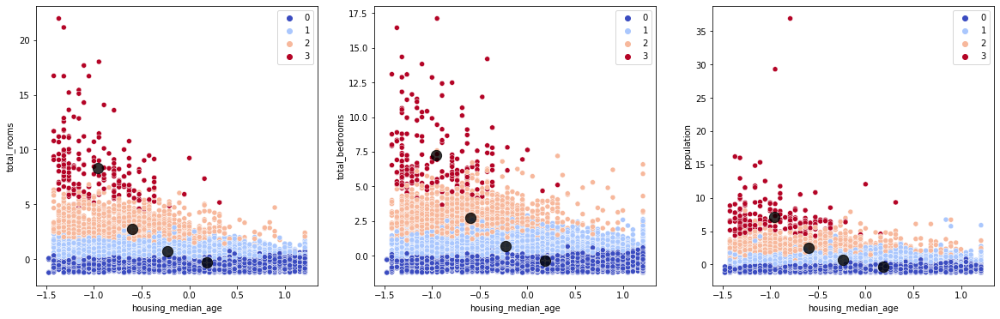

robust and onehot, 
silhouette score of k= 4 is 0.2435358642961944



          0         1         2         3
0  0.184502 -0.338672 -0.336305 -0.329048
1 -0.233491  0.688838  0.706671  0.690665
2 -0.600621  2.774652  2.699646  2.496977
3 -0.960388  8.307402  7.256395  7.179488
[0 2 0 0 0 0 0 1 1 1]


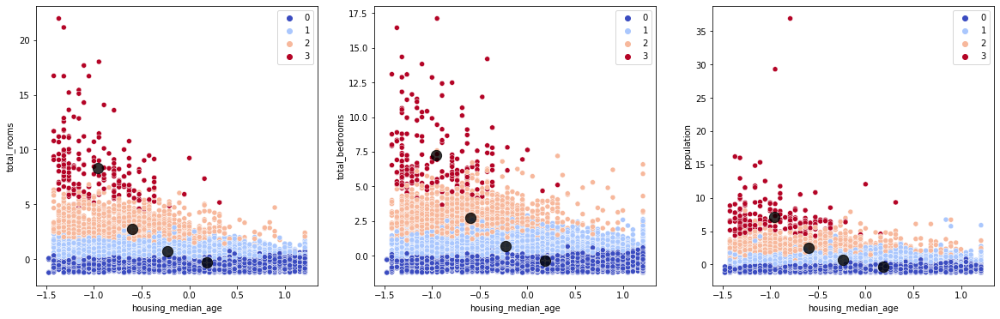

robust and label, 
silhouette score of k= 4 is 0.213086943840976



          0         1         2         3
0  0.645287  0.053248  0.068265  0.034759
1  0.904539  0.045504  0.060733  0.028228
2  0.391580  0.067525  0.083377  0.039589
3  0.182620  0.122493  0.143910  0.065827
[1 2 1 1 1 1 1 1 1 1]


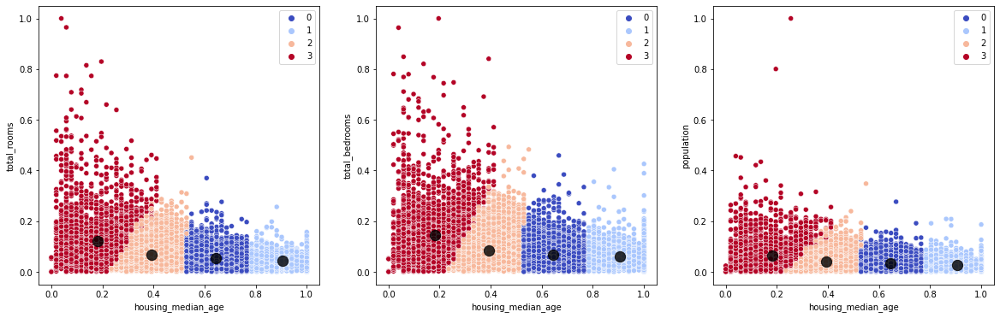

minmax and onehot, 
silhouette score of k= 4 is 0.2828376340690781



          0         1         2         3
0  0.645287  0.053248  0.068265  0.034759
1  0.904539  0.045504  0.060733  0.028228
2  0.391580  0.067525  0.083377  0.039589
3  0.182620  0.122493  0.143910  0.065827
[1 2 1 1 1 1 1 1 1 1]


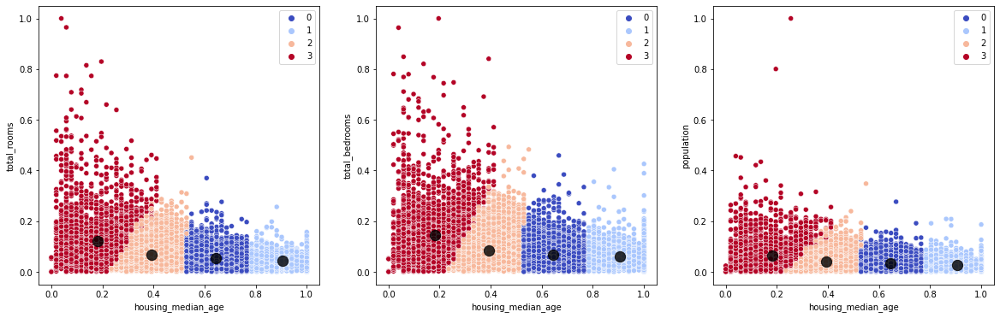

minmax and label, 
silhouette score of k= 4 is 0.21777261104911375



          0         1         2         3
0 -0.873918  0.627861  0.653597  0.597043
1  0.463725  0.047681  0.129753  0.195729
2  1.001811 -0.546372 -0.570459 -0.542375
3 -1.427311  6.304376  5.908666  5.804887
4 -0.792890 -0.403460 -0.457202 -0.464338
5 -0.939769  2.175987  2.263881  2.065066
[2 5 2 2 2 2 2 1 1 1]


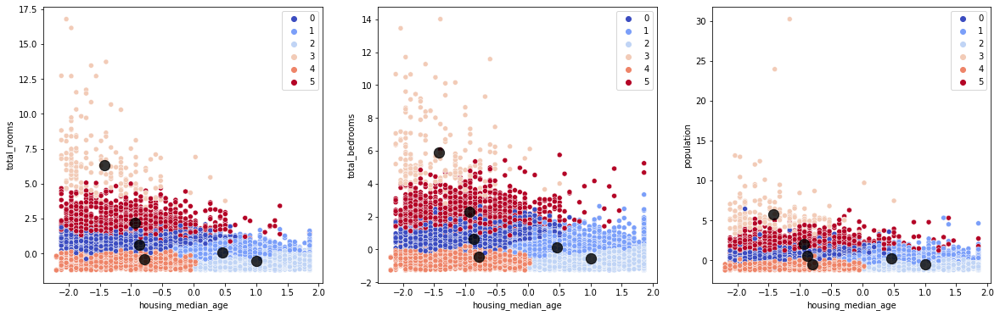

standard and onehot, 
silhouette score of k= 6 is 0.1808854577336479



          0         1         2         3
0 -0.873918  0.627861  0.653597  0.597043
1  0.463725  0.047681  0.129753  0.195729
2  1.001811 -0.546372 -0.570459 -0.542375
3 -1.427311  6.304376  5.908666  5.804887
4 -0.792890 -0.403460 -0.457202 -0.464338
5 -0.939769  2.175987  2.263881  2.065066
[2 5 2 2 2 2 2 1 1 1]


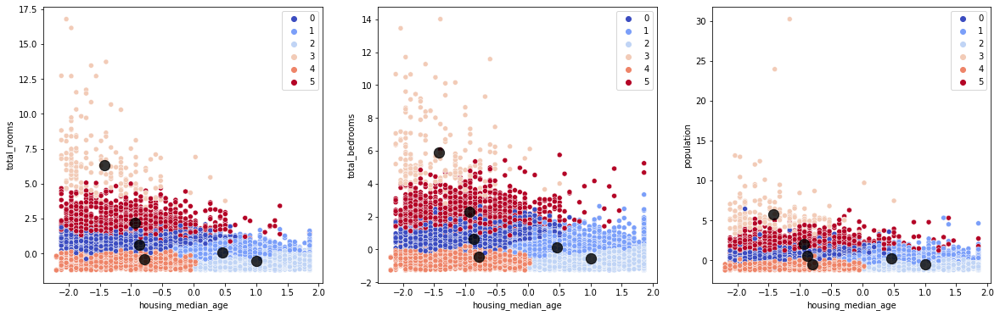

standard and label, 
silhouette score of k= 6 is 0.16510651600585138



          0          1         2         3
0 -0.160774   0.575385  0.589482  0.594222
1  0.612971  -0.354157 -0.336421 -0.309648
2 -1.071021  10.681253  9.069063  9.015888
3 -0.747812   4.620307  4.337778  4.120799
4 -0.514117  -0.321823 -0.347113 -0.377634
5 -0.513847   1.953204  1.960789  1.802585
[1 5 1 1 1 1 1 0 0 0]


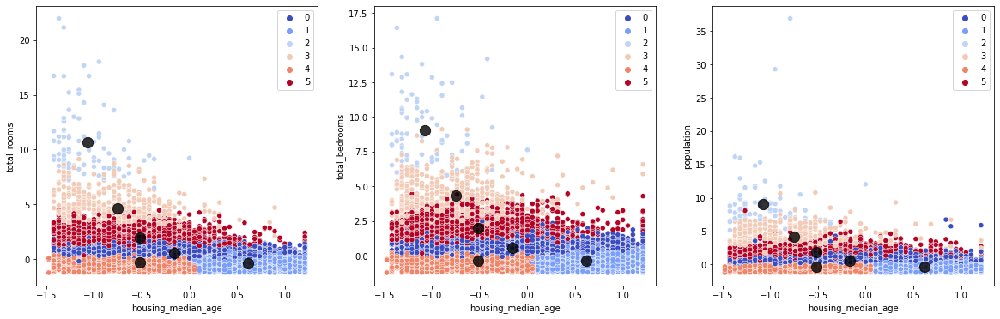

robust and onehot, 
silhouette score of k= 6 is 0.302487259092881



          0          1         2         3
0 -0.160774   0.575385  0.589482  0.594222
1  0.612971  -0.354157 -0.336421 -0.309648
2 -1.071021  10.681253  9.069063  9.015888
3 -0.747812   4.620307  4.337778  4.120799
4 -0.514117  -0.321823 -0.347113 -0.377634
5 -0.513847   1.953204  1.960789  1.802585
[1 5 1 1 1 1 1 0 0 0]


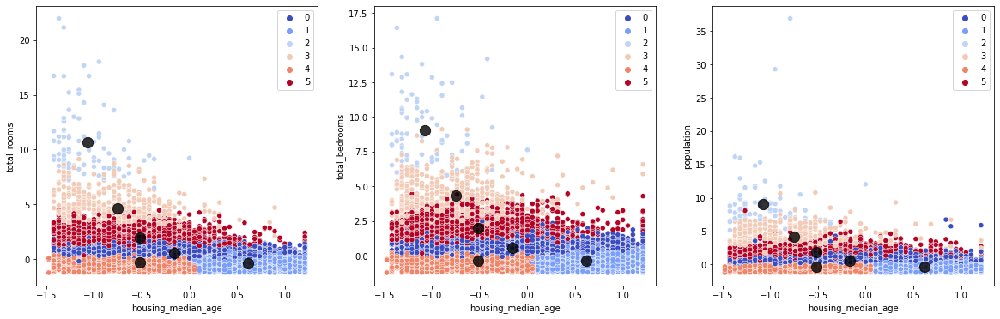

robust and label, 
silhouette score of k= 6 is 0.2671753878784859



          0         1         2         3
0  0.507197  0.067030  0.085473  0.041571
1  0.914471  0.045808  0.060954  0.028147
2  0.145522  0.083357  0.097904  0.045370
3  0.680474  0.049068  0.062608  0.032349
4  0.326813  0.069642  0.084843  0.039586
5  0.226891  0.285481  0.332935  0.150658
[3 4 1 1 1 1 1 1 1 1]


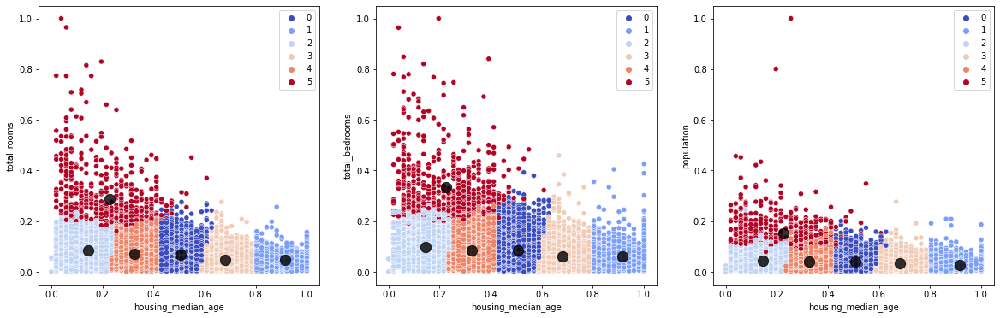

minmax and onehot, 
silhouette score of k= 6 is 0.30059100160698177



          0         1         2         3
0  0.507197  0.067030  0.085473  0.041571
1  0.914471  0.045808  0.060954  0.028147
2  0.145522  0.083357  0.097904  0.045370
3  0.680474  0.049068  0.062608  0.032349
4  0.326813  0.069642  0.084843  0.039586
5  0.226891  0.285481  0.332935  0.150658
[3 4 1 1 1 1 1 1 1 1]


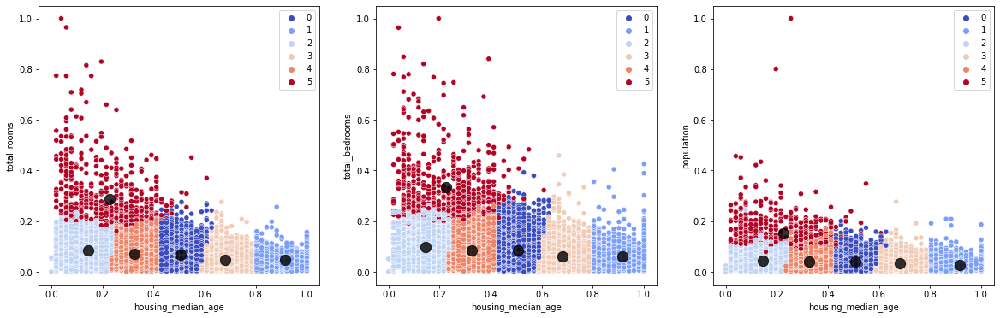

minmax and label, 
silhouette score of k= 6 is 0.2306805812958182



          0         1         2         3
0  1.488101 -0.433632 -0.424332 -0.450171
1 -0.868368  1.929407  2.045805  1.853296
2 -0.920521  0.618668  0.634468  0.571676
3  0.344084  0.109097  0.195048  0.277467
4 -1.337207  4.696290  4.512051  4.321051
5 -1.608871  9.705777  8.895714  9.043397
6 -0.975049 -0.352078 -0.409932 -0.426134
7  0.362458 -0.567720 -0.606649 -0.545309
[7 1 0 0 0 0 0 0 3 0]


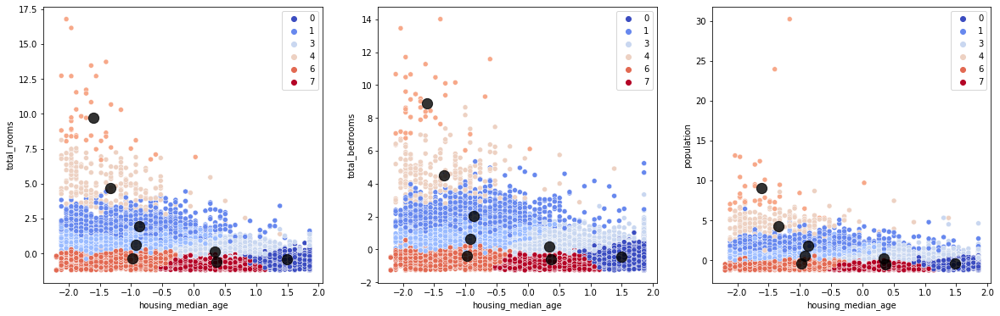

standard and onehot, 
silhouette score of k= 8 is 0.18787306017288868



          0         1         2         3
0  1.488101 -0.433632 -0.424332 -0.450171
1 -0.868368  1.929407  2.045805  1.853296
2 -0.920521  0.618668  0.634468  0.571676
3  0.344084  0.109097  0.195048  0.277467
4 -1.337207  4.696290  4.512051  4.321051
5 -1.608871  9.705777  8.895714  9.043397
6 -0.975049 -0.352078 -0.409932 -0.426134
7  0.362458 -0.567720 -0.606649 -0.545309
[7 1 0 0 0 0 0 0 3 0]


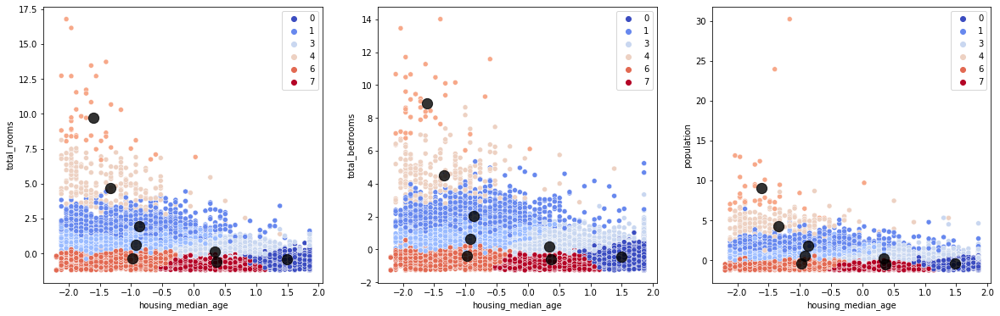

standard and label, 
silhouette score of k= 8 is 0.1654355769513976



          0          1          2          3
0 -0.286972   0.700764   0.699481   0.709818
1 -0.580603  -0.167394  -0.206127  -0.244480
2 -0.661530   3.564742   3.422327   3.180903
3 -1.095568  13.046554  10.937172  11.470532
4  0.429492  -0.659190  -0.646881  -0.623927
5  0.576356  -0.010246   0.030779   0.053702
6 -0.487702   1.778239   1.804003   1.662854
7 -0.910955   6.934398   6.220897   5.876750
[4 6 4 4 4 4 5 5 5 5]


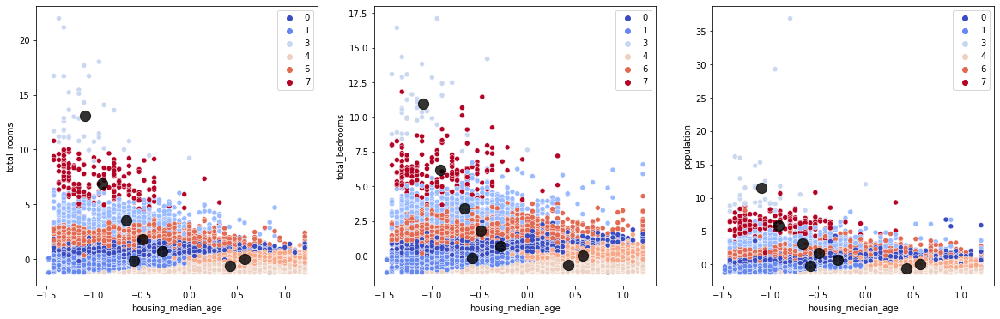

robust and onehot, 
silhouette score of k= 8 is 0.2370061078361144



          0          1          2          3
0 -0.286972   0.700764   0.699481   0.709818
1 -0.580603  -0.167394  -0.206127  -0.244480
2 -0.661530   3.564742   3.422327   3.180903
3 -1.095568  13.046554  10.937172  11.470532
4  0.429492  -0.659190  -0.646881  -0.623927
5  0.576356  -0.010246   0.030779   0.053702
6 -0.487702   1.778239   1.804003   1.662854
7 -0.910955   6.934398   6.220897   5.876750
[4 6 4 4 4 4 5 5 5 5]


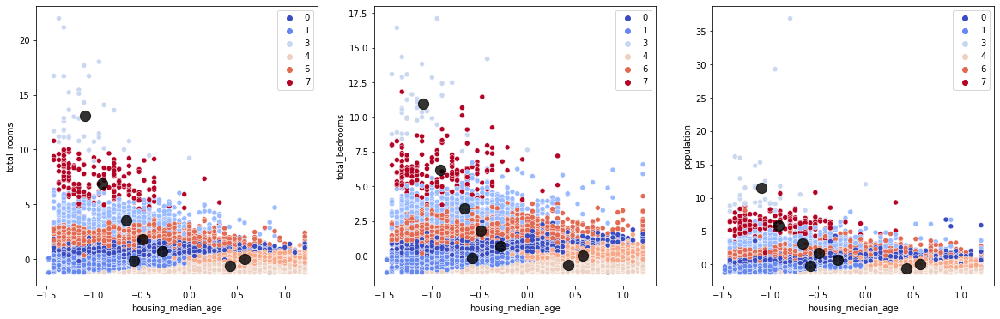

robust and label, 
silhouette score of k= 8 is 0.2053429334311523



          0         1         2         3
0  0.494703  0.061663  0.077596  0.038246
1  0.810861  0.044912  0.060500  0.030123
2  0.139067  0.086296  0.100536  0.046638
3  0.356356  0.160325  0.206237  0.090471
4  0.315716  0.059629  0.071309  0.033830
5  0.657513  0.051171  0.064711  0.033471
6  0.975986  0.046690  0.061810  0.026817
7  0.156863  0.363174  0.406002  0.188414
[1 3 6 6 6 6 6 6 1 6]


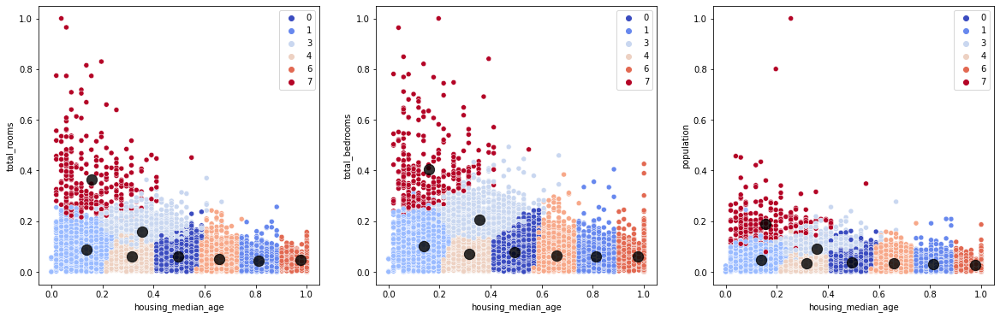

minmax and onehot, 
silhouette score of k= 8 is 0.2944896194737514



          0         1         2         3
0  0.494703  0.061663  0.077596  0.038246
1  0.810861  0.044912  0.060500  0.030123
2  0.139067  0.086296  0.100536  0.046638
3  0.356356  0.160325  0.206237  0.090471
4  0.315716  0.059629  0.071309  0.033830
5  0.657513  0.051171  0.064711  0.033471
6  0.975986  0.046690  0.061810  0.026817
7  0.156863  0.363174  0.406002  0.188414
[1 3 6 6 6 6 6 6 1 6]


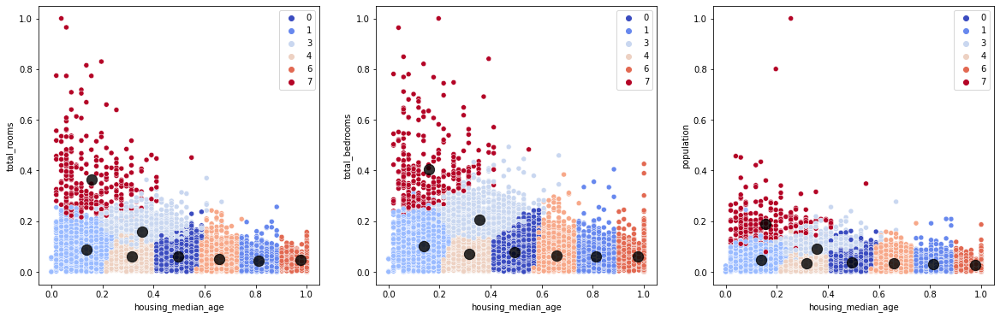

minmax and label, 
silhouette score of k= 8 is 0.21988052096211733



          0         1         2         3
0  0.533071 -0.686483 -0.729605 -0.671080
1 -0.973573  2.570457  2.675857  2.458217
2 -1.031041  0.250619  0.202080  0.161592
3  1.525059 -0.388004 -0.369902 -0.400859
4 -0.926806  1.238070  1.293288  1.157752
5 -1.627307  9.978697  8.951009  9.598213
6  0.229539 -0.175997 -0.177276 -0.107706
7 -0.944821 -0.522420 -0.577869 -0.595166
8 -1.363051  5.247463  5.028915  4.691314
9  0.329146  0.390399  0.580807  0.668628
[0 4 3 3 3 3 3 3 3 3]


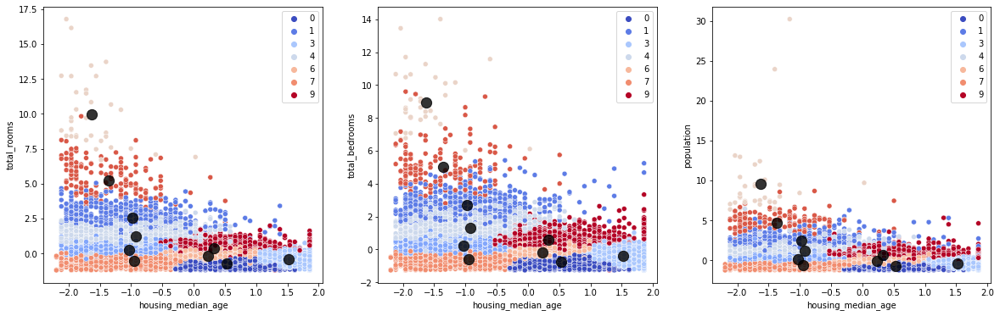

standard and onehot, 
silhouette score of k= 10 is 0.2545857366657236



          0         1         2         3
0  0.533071 -0.686483 -0.729605 -0.671080
1 -0.973573  2.570457  2.675857  2.458217
2 -1.031041  0.250619  0.202080  0.161592
3  1.525059 -0.388004 -0.369902 -0.400859
4 -0.926806  1.238070  1.293288  1.157752
5 -1.627307  9.978697  8.951009  9.598213
6  0.229539 -0.175997 -0.177276 -0.107706
7 -0.944821 -0.522420 -0.577869 -0.595166
8 -1.363051  5.247463  5.028915  4.691314
9  0.329146  0.390399  0.580807  0.668628
[0 4 3 3 3 3 3 3 3 3]


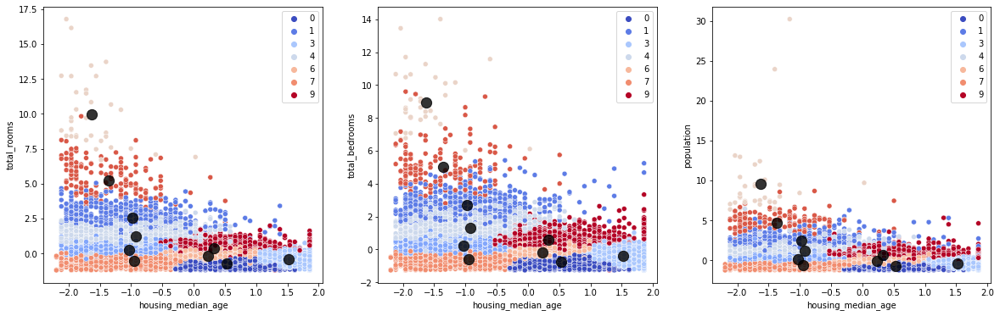

standard and label, 
silhouette score of k= 10 is 0.224618267181087



          0          1          2          3
0 -0.510598  -0.481288  -0.495049  -0.524776
1 -0.539519   0.294439   0.226405   0.182640
2 -0.921218   6.988740   6.202655   5.967935
3  0.609571  -0.570417  -0.561071  -0.534964
4 -0.542255   2.083378   2.072155   1.882673
5  0.542786   0.048510   0.100576   0.131334
6 -1.105263  18.480567  14.849003  22.749091
7 -0.245024   0.931092   0.977937   0.992759
8 -0.687268   3.805204   3.638880   3.412939
9 -1.092105  11.986858  10.351535   9.503387
[3 4 3 3 3 3 5 5 5 5]


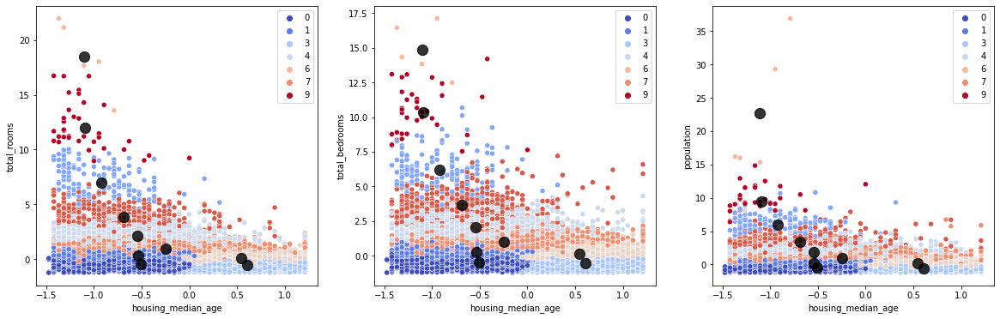

robust and onehot, 
silhouette score of k= 10 is 0.28379247033156857



          0          1          2          3
0 -0.510598  -0.481288  -0.495049  -0.524776
1 -0.539519   0.294439   0.226405   0.182640
2 -0.921218   6.988740   6.202655   5.967935
3  0.609571  -0.570417  -0.561071  -0.534964
4 -0.542255   2.083378   2.072155   1.882673
5  0.542786   0.048510   0.100576   0.131334
6 -1.105263  18.480567  14.849003  22.749091
7 -0.245024   0.931092   0.977937   0.992759
8 -0.687268   3.805204   3.638880   3.412939
9 -1.092105  11.986858  10.351535   9.503387
[3 4 3 3 3 3 5 5 5 5]


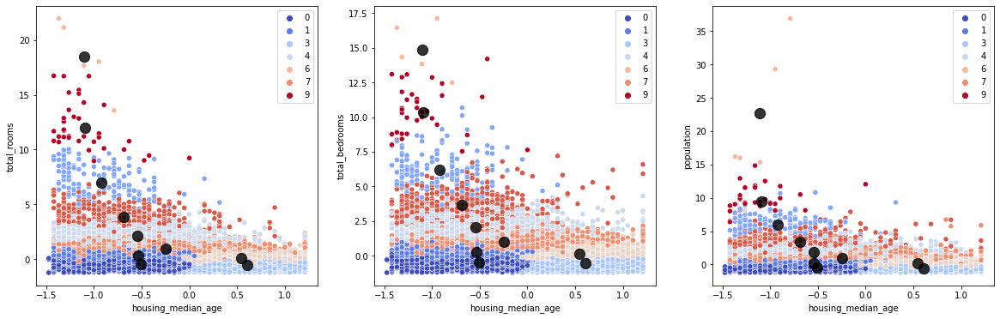

robust and label, 
silhouette score of k= 10 is 0.2457898466291474



          0         1         2         3
0  0.457073  0.059045  0.072425  0.035713
1  0.684761  0.046252  0.058352  0.030429
2  0.160872  0.177284  0.204134  0.092984
3  0.828359  0.044482  0.059974  0.029797
4  0.307571  0.062482  0.074712  0.035138
5  0.167843  0.424033  0.474514  0.218158
6  0.401079  0.158956  0.207451  0.091492
7  0.140108  0.062270  0.074273  0.034984
8  0.580457  0.061900  0.080123  0.040188
9  0.984215  0.046895  0.061955  0.026504
[3 6 9 9 9 9 9 9 3 9]


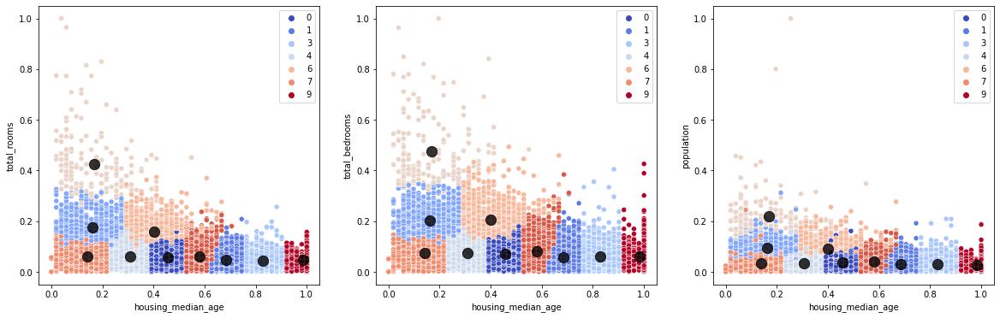

minmax and onehot, 
silhouette score of k= 10 is 0.30506329878520866



          0         1         2         3
0  0.457073  0.059045  0.072425  0.035713
1  0.684761  0.046252  0.058352  0.030429
2  0.160872  0.177284  0.204134  0.092984
3  0.828359  0.044482  0.059974  0.029797
4  0.307571  0.062482  0.074712  0.035138
5  0.167843  0.424033  0.474514  0.218158
6  0.401079  0.158956  0.207451  0.091492
7  0.140108  0.062270  0.074273  0.034984
8  0.580457  0.061900  0.080123  0.040188
9  0.984215  0.046895  0.061955  0.026504
[3 6 9 9 9 9 9 9 3 9]


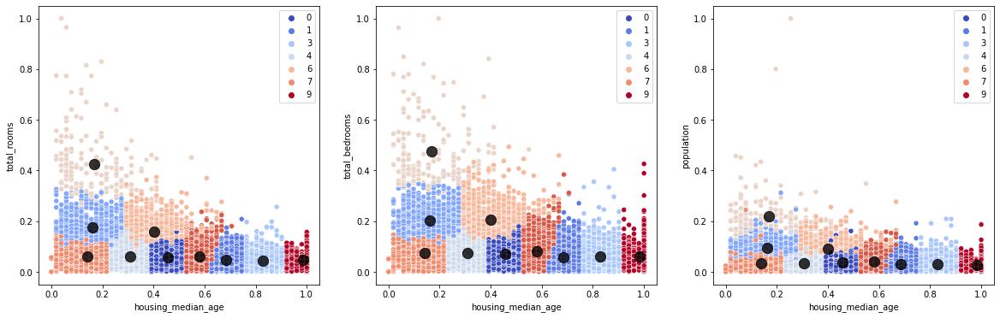

minmax and label, 
silhouette score of k= 10 is 0.22110554417603936





In [122]:
for i in range(2,12,2):
    cnt=0
    for q in scaling_method:
        engineeredDf = q[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population']]
        q['cluster_id']=kmeans(engineeredDf, i)
        if cnt==0:
          print("standard and onehot, ")
        if cnt==1:
          print("standard and label, ")
        if cnt==2:
          print("robust and onehot, ")
        if cnt==3:
          print("robust and label, ")
        if cnt==4:
          print("minmax and onehot, ")
        if cnt==5:
          print("minmax and label, ")
        print('silhouette score of', 'k=',i,'is',silhouette(q))
        cnt=cnt+1
        print("\n\n")
        

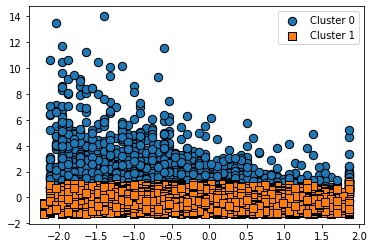

standard and onehot, 
silhouette score of k= 2 is 0.2898580775438565





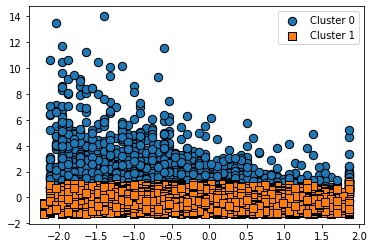

standard and label, 
silhouette score of k= 2 is 0.2680934879952477





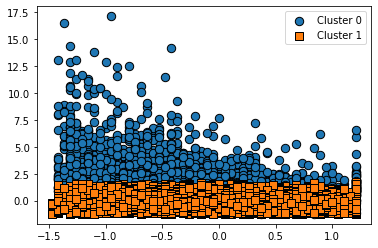

robust and onehot, 
silhouette score of k= 2 is 0.3919604794580177





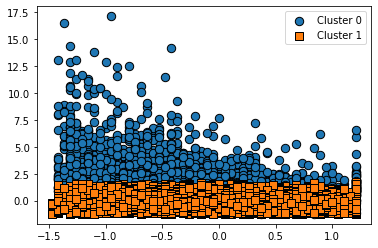

robust and label, 
silhouette score of k= 2 is 0.3608666899541114





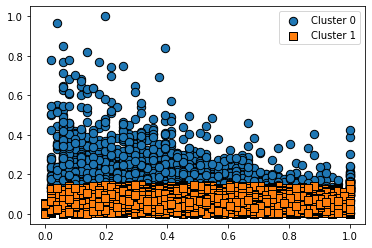

minmax and onehot, 
silhouette score of k= 2 is 0.2532024366121069





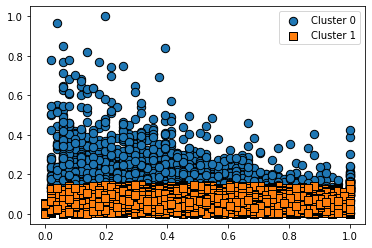

minmax and label, 
silhouette score of k= 2 is 0.1990189181179195





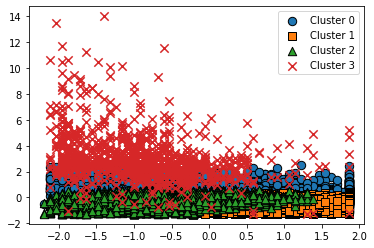

standard and onehot, 
silhouette score of k= 4 is 0.1408838040496011





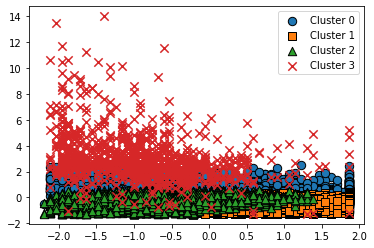

standard and label, 
silhouette score of k= 4 is 0.12437442181498612





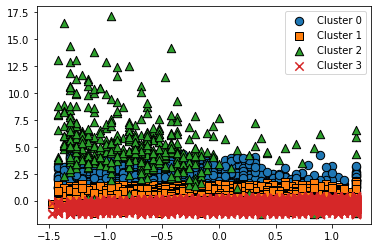

robust and onehot, 
silhouette score of k= 4 is 0.2555669454949656





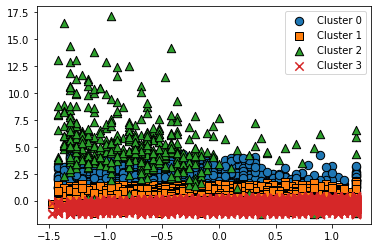

robust and label, 
silhouette score of k= 4 is 0.223396559551826





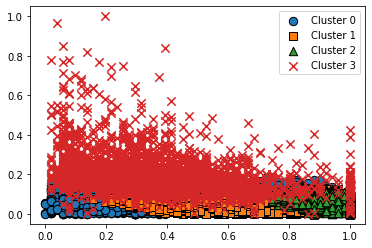

minmax and onehot, 
silhouette score of k= 4 is 0.2783429598002353





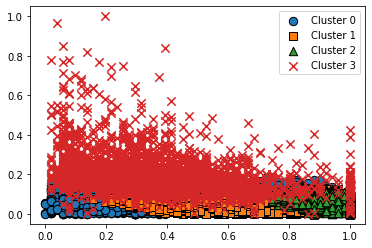

minmax and label, 
silhouette score of k= 4 is 0.21419812517855888





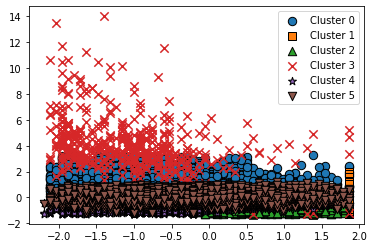

standard and onehot, 
silhouette score of k= 6 is 0.16623570898944337





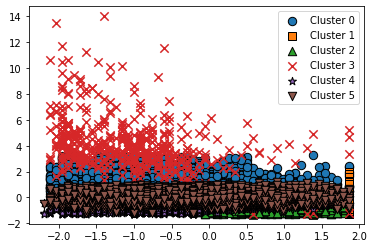

standard and label, 
silhouette score of k= 6 is 0.1499136952058137





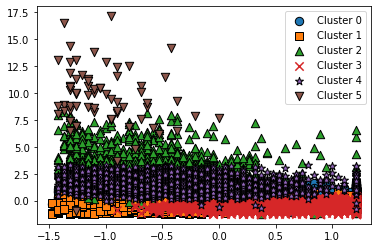

robust and onehot, 
silhouette score of k= 6 is 0.23976072582637611





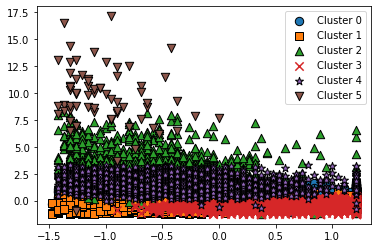

robust and label, 
silhouette score of k= 6 is 0.20453956789363278





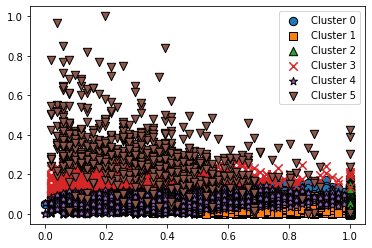

minmax and onehot, 
silhouette score of k= 6 is 0.268662038613062





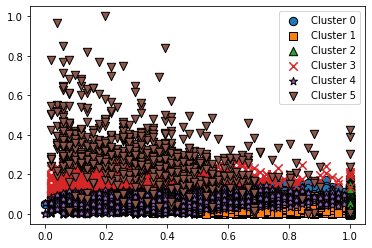

minmax and label, 
silhouette score of k= 6 is 0.18704279732723147





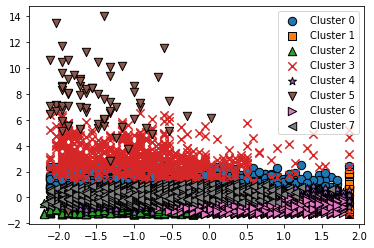

standard and onehot, 
silhouette score of k= 8 is 0.21007105863708286





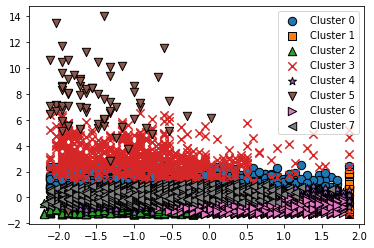

standard and label, 
silhouette score of k= 8 is 0.1867500670705485





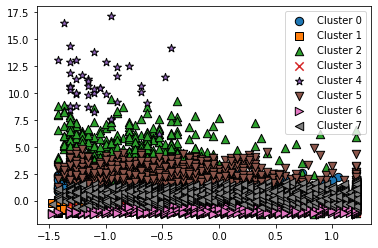

robust and onehot, 
silhouette score of k= 8 is 0.27383127827785064





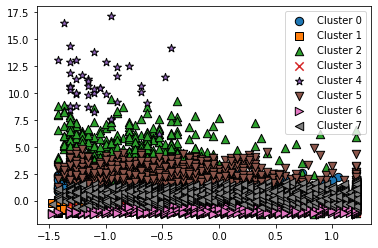

robust and label, 
silhouette score of k= 8 is 0.23839367151245827





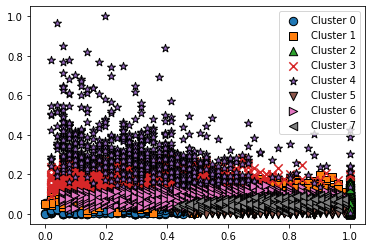

minmax and onehot, 
silhouette score of k= 8 is 0.2848322362947541





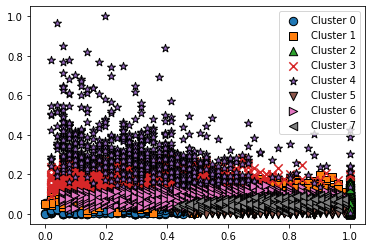

minmax and label, 
silhouette score of k= 8 is 0.20210874009426424





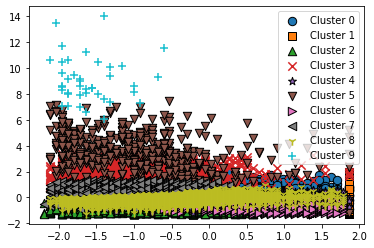

standard and onehot, 
silhouette score of k= 10 is 0.1973560528857632





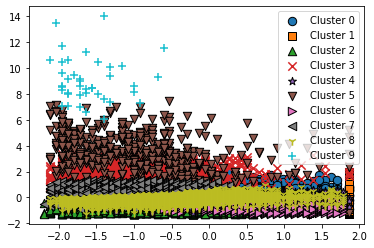

standard and label, 
silhouette score of k= 10 is 0.1744881970011549





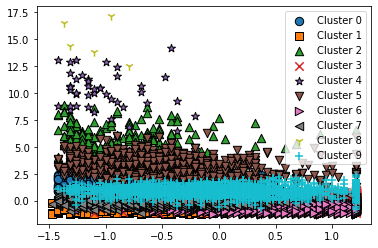

robust and onehot, 
silhouette score of k= 10 is 0.28550551677031916





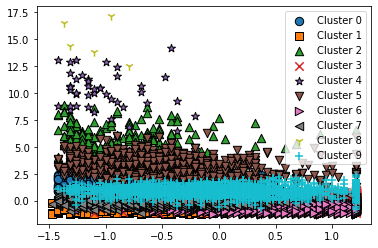

robust and label, 
silhouette score of k= 10 is 0.2462549577884913





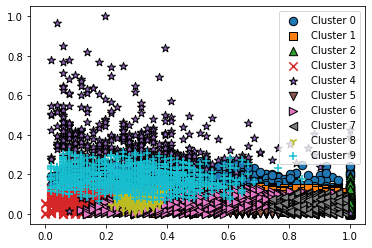

minmax and onehot, 
silhouette score of k= 10 is 0.2854767605801109





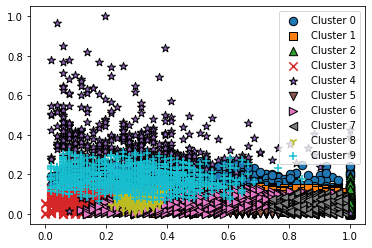

minmax and label, 
silhouette score of k= 10 is 0.20751065828803678





In [123]:
for i in range(2,12,2):
    cnt=0
    for q in scaling_method:
        engineeredDf = q[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population']]
        q['cluster_id']=gmm(engineeredDf, i)
        if cnt==0:
          print("standard and onehot, ")
        if cnt==1:
          print("standard and label, ")
        if cnt==2:
          print("robust and onehot, ")
        if cnt==3:
          print("robust and label, ")
        if cnt==4:
          print("minmax and onehot, ")
        if cnt==5:
          print("minmax and label, ")
        print('silhouette score of', 'k=',i,'is',silhouette(q))
        cnt=cnt+1
        print("\n\n")

0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


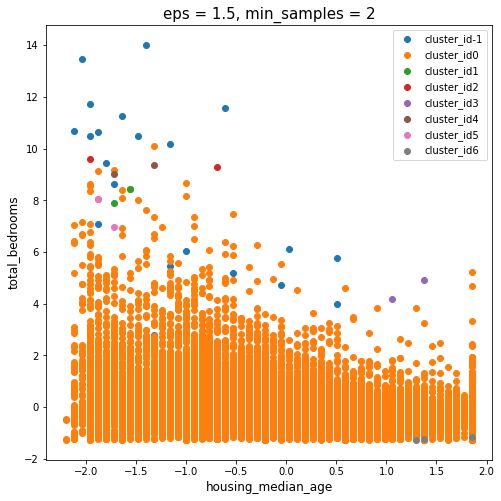

standard and onehot, 
silhouette score of k= 2 is 0.5438580718232011



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


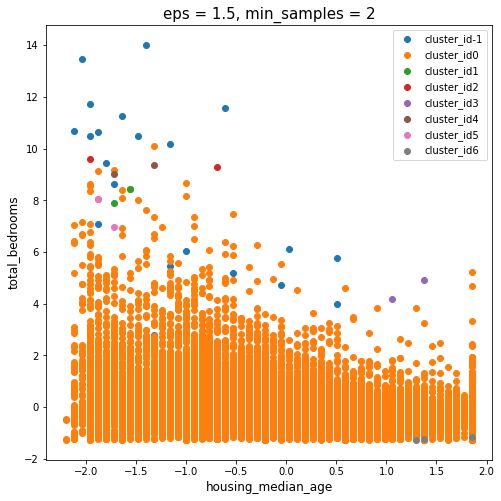

standard and label, 
silhouette score of k= 2 is 0.5179865753028566



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


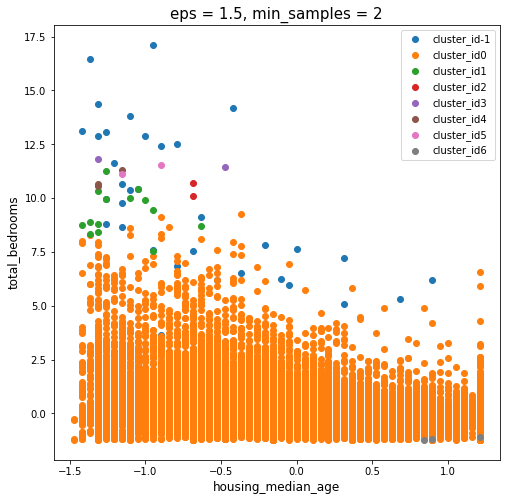

robust and onehot, 
silhouette score of k= 2 is 0.6298299851197927



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


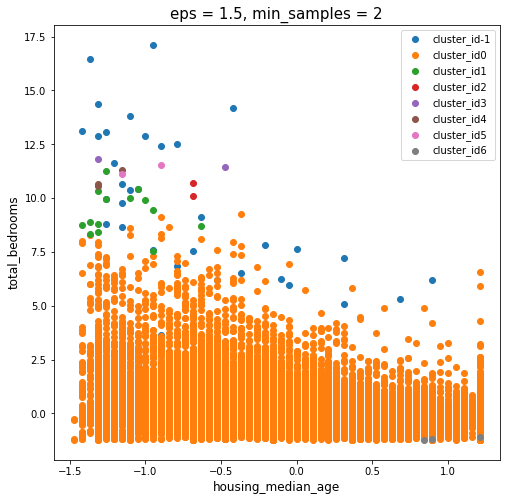

robust and label, 
silhouette score of k= 2 is 0.601425588852433



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


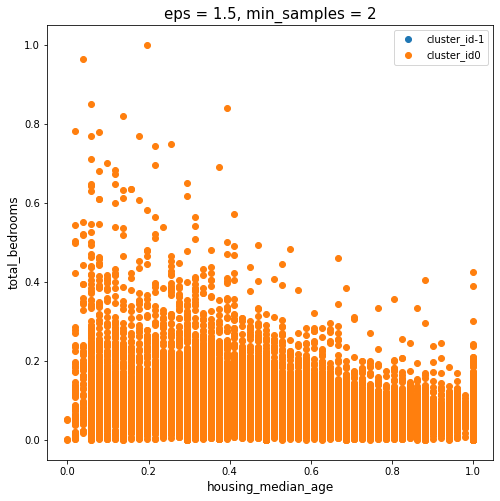

minmax and onehot, 
0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


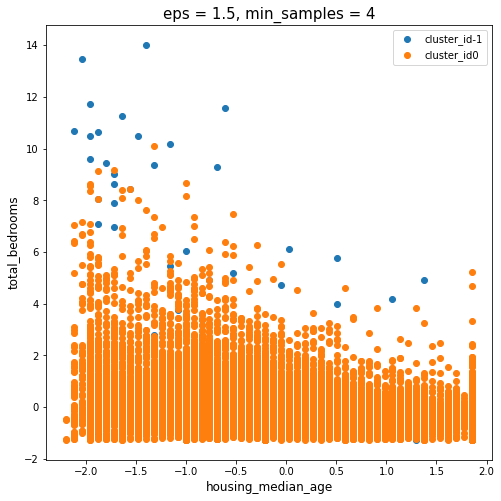

standard and onehot, 
silhouette score of k= 4 is 0.7517773280423875



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


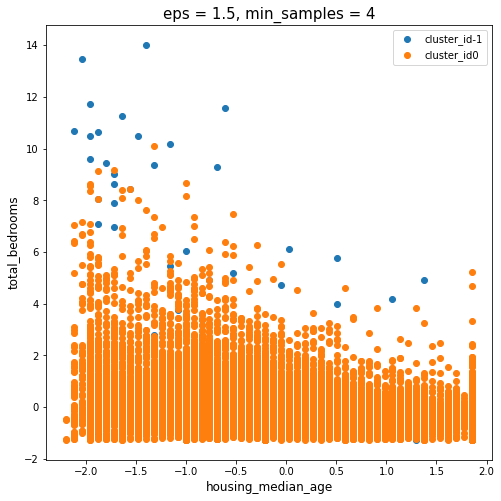

standard and label, 
silhouette score of k= 4 is 0.7348808952544751



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


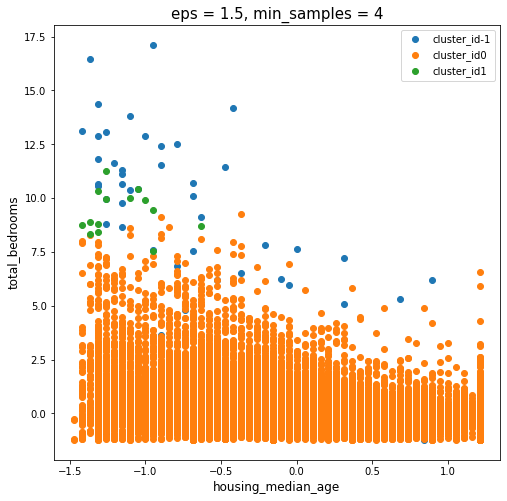

robust and onehot, 
silhouette score of k= 4 is 0.8008893528559616



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


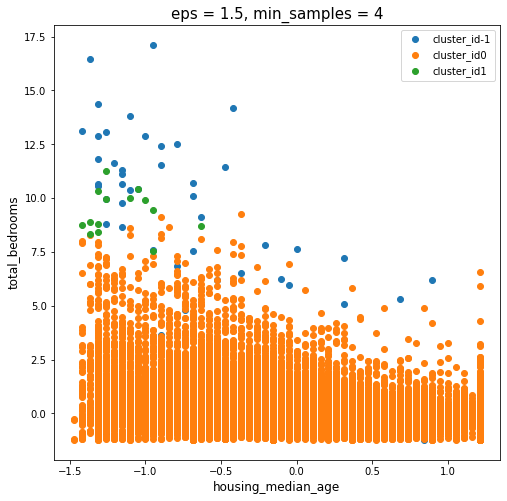

robust and label, 
silhouette score of k= 4 is 0.7841564091815975



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


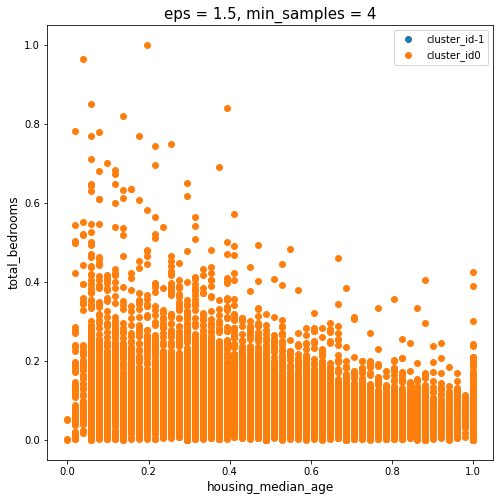

minmax and onehot, 
0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


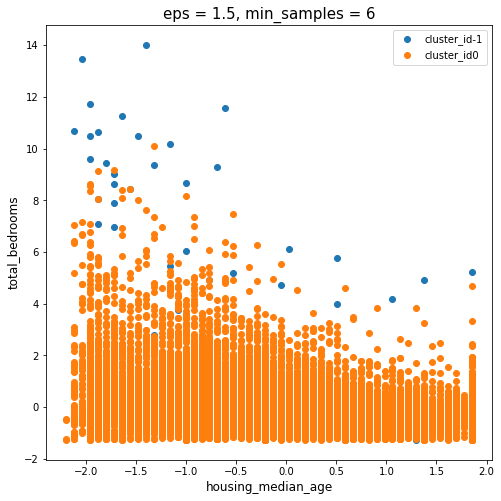

standard and onehot, 
silhouette score of k= 6 is 0.7478910676395188



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


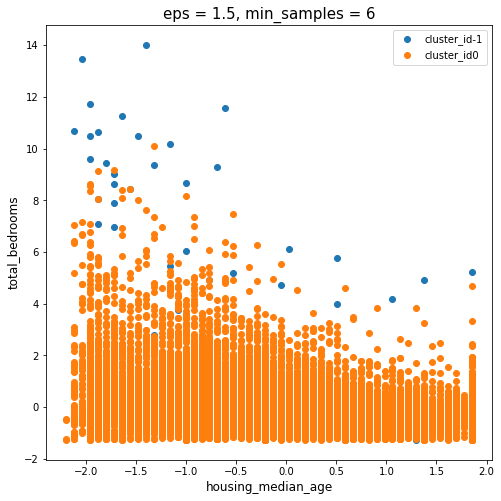

standard and label, 
silhouette score of k= 6 is 0.7307984937955522



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


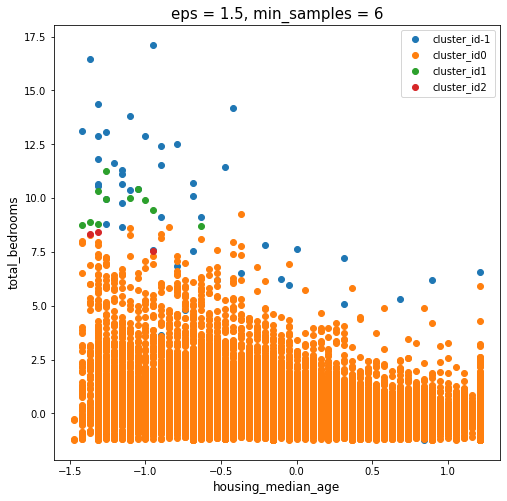

robust and onehot, 
silhouette score of k= 6 is 0.7954252316326228



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


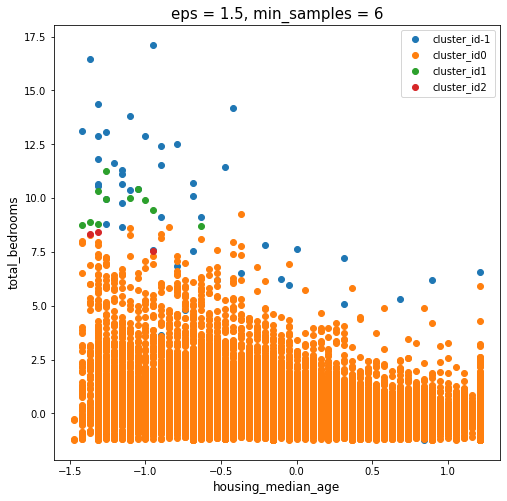

robust and label, 
silhouette score of k= 6 is 0.7778568177492718



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


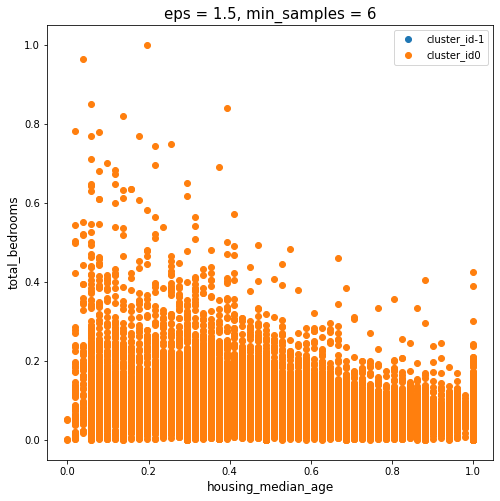

minmax and onehot, 
0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


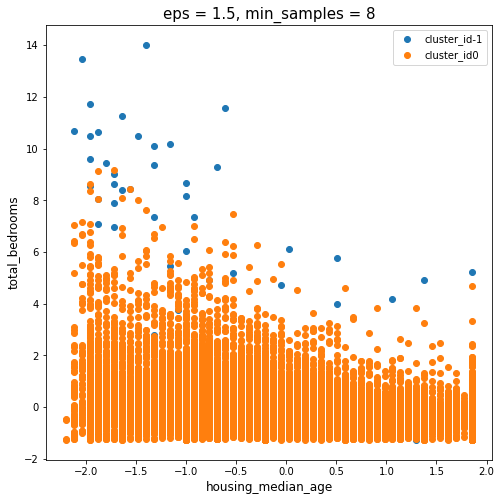

standard and onehot, 
silhouette score of k= 8 is 0.7476303160228297



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


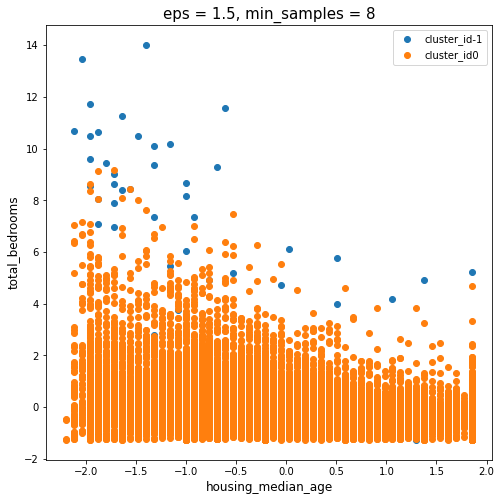

standard and label, 
silhouette score of k= 8 is 0.7305210987976299



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


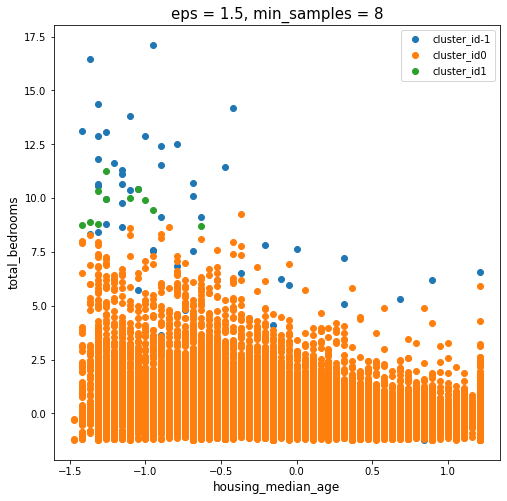

robust and onehot, 
silhouette score of k= 8 is 0.7960015201836862



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


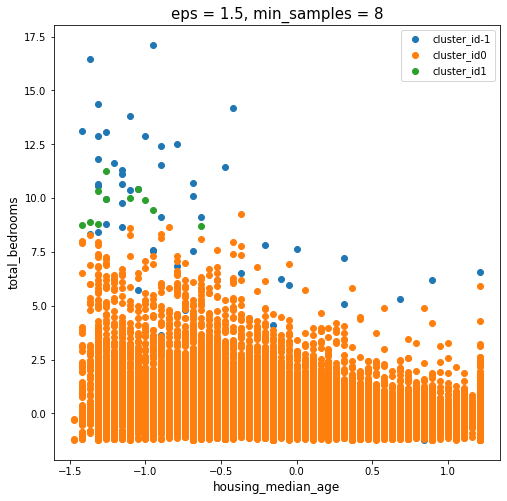

robust and label, 
silhouette score of k= 8 is 0.7788615412804066



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


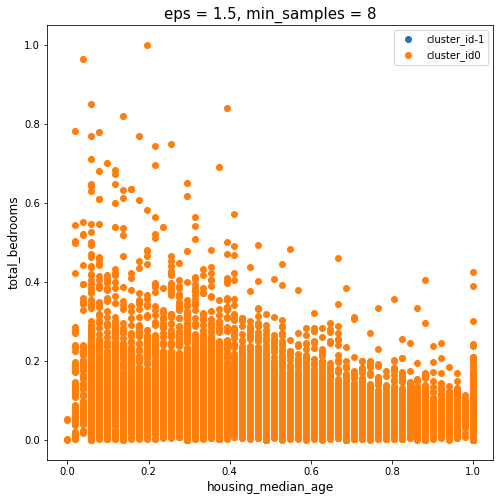

minmax and onehot, 
0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


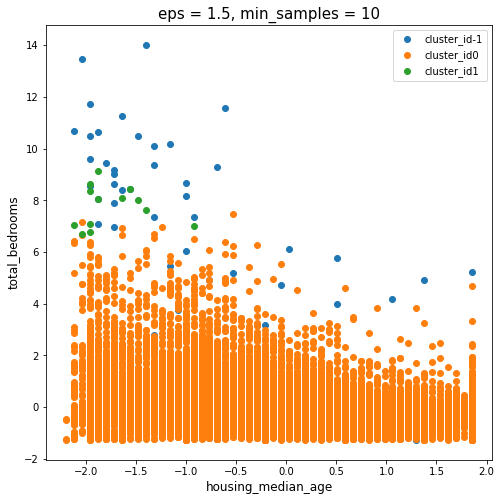

standard and onehot, 
silhouette score of k= 10 is 0.7427029061587569



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


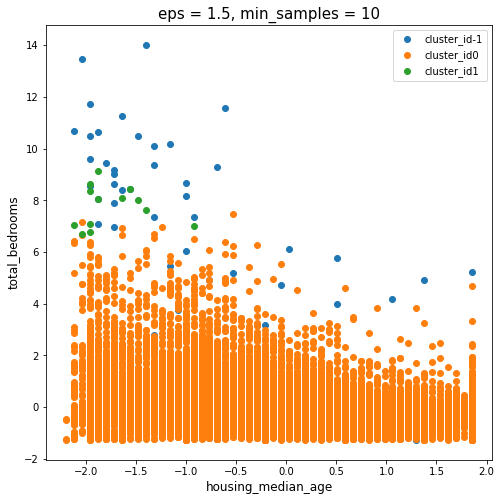

standard and label, 
silhouette score of k= 10 is 0.7254217034109414



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


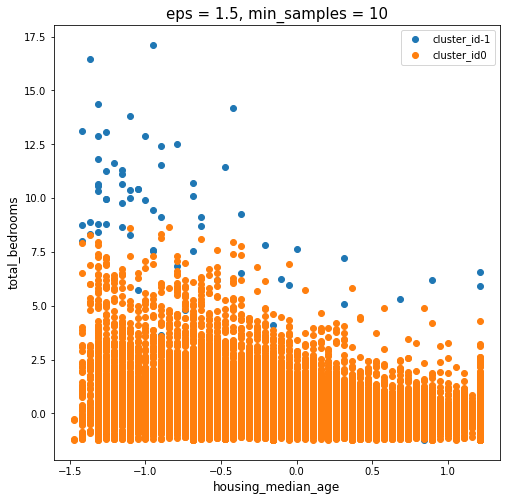

robust and onehot, 
silhouette score of k= 10 is 0.7981701196604418



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


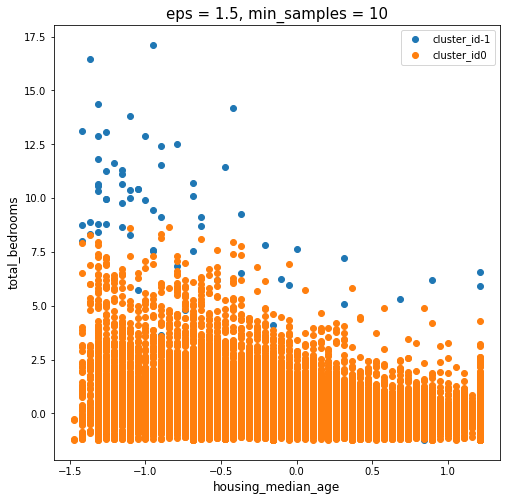

robust and label, 
silhouette score of k= 10 is 0.7809332154845435



0        0
1        0
2        0
3        0
4        0
        ..
20428    0
20429    0
20430    0
20431    0
20432    0
Name: cluster_id, Length: 20433, dtype: int64


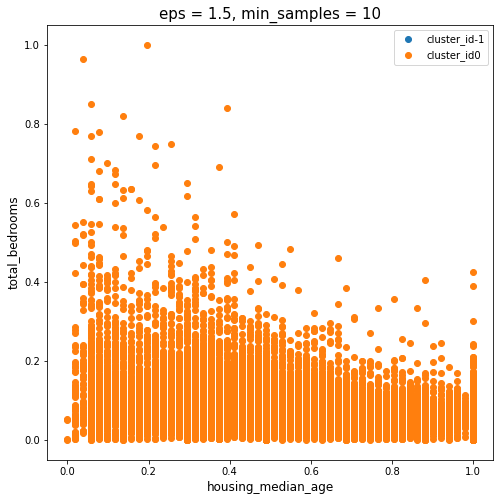

minmax and onehot, 


In [130]:
for i in range(2,12,2):#in this case k is not the number of cluster but required minimum samples number which need to be a cluster
    try:    
        cnt=0
        for q in scaling_method:
            engineeredDf = q[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population']]

            q['cluster_id']=dbScan(engineeredDf, i,1.5)
            if cnt==0:
              print("standard and onehot, ")
            if cnt==1:
              print("standard and label, ")
            if cnt==2:
              print("robust and onehot, ")
            if cnt==3:
              print("robust and label, ")
            if cnt==4:
              print("minmax and onehot, ")
            if cnt==5:
              print("minmax and label, ")
            print('silhouette score of', 'k=',i,'is',silhouette(q))
            cnt=cnt+1
            print("\n\n")
    except:
       pass

In [126]:
def  kmeansElbow_plot(df):
    sse = {}
    for k in range(2,12,2):
        kmeans = KMeans(n_clusters=k, random_state=1)
        kmeans.fit(df)
        sse[k] = kmeans.inertia_
    
    plt.title('Elbow plot for K selection')
    plt.xlabel('k')
    plt.ylabel('SSE')
    sns.pointplot(x=list(sse.keys()),
                 y=list(sse.values()))
    plt.show()

standard and onehot, 


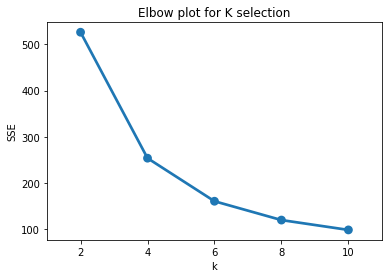

standard and onehot, 


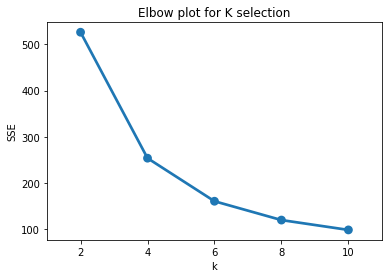

standard and onehot, 


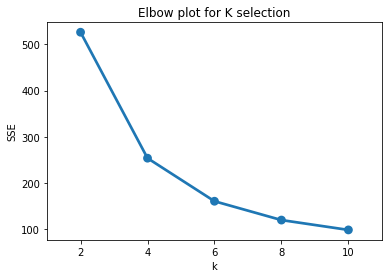

standard and onehot, 


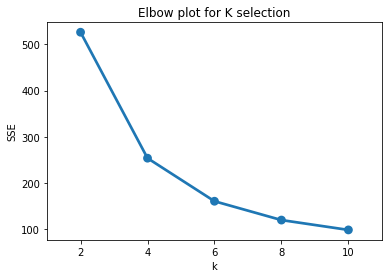

standard and onehot, 


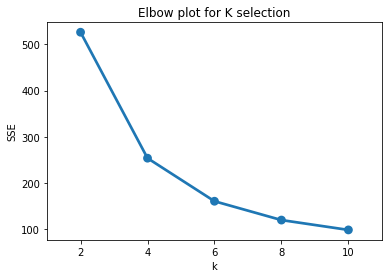

standard and onehot, 


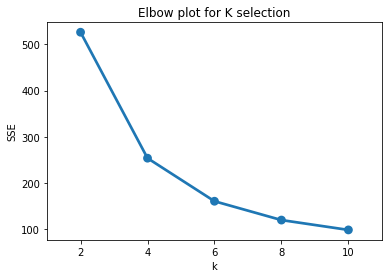

In [133]:
for i in scaling_method:
    cnt=0
    engineeredDf = q[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population']]
    if cnt==0:
       print("standard and onehot, ")
    if cnt==1:
      print("standard and label, ")
    if cnt==2:
      print("robust and onehot, ")
    if cnt==3:
      print("robust and label, ")
    if cnt==4:
      print("minmax and onehot, ")
    if cnt==5:
       print("minmax and label, ")
    cnt=+1
    kmeansElbow_plot(engineeredDf)

In [ ]:
#for i range(2,12,2)
#    for q in scaling_method:
 #       engineeredDf = q[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population']]
  #      gmm = GaussianMixture(n_components=k, random_state=11).fit(engineeredDf)
   #     pred = gmm.predict(engineeredDf)

In [136]:
#purity
from sklearn import metrics
def purity_score(y_true, y_pred):
    # compute contingency matrix (also called confusion matrix)
    contingency_matrix = metrics.cluster.contingency_matrix(y_true, y_pred)
    # return purity
    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix) 

In [160]:
print('purity of kmeans')
for i in scaling_method:
    cnt=0
    engineeredDf = q[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population']]
    for k in range(2,12,2):
        if cnt==0:
          print("standard and onehot, ")
        if cnt==1:
          print("standard and label, ")
        if cnt==2:
          print("robust and onehot, ")
        if cnt==3:
          print("robust and label, ")
        if cnt==4:
          print("minmax and onehot, ")
        if cnt==5:
          print("minmax and label, ")
        kmeans = KMeans(n_clusters=k, random_state = 10).fit(engineeredDf)
        pred = kmeans.predict(engineeredDf)
        y_pred=pred
        print(purity_score(st_label_df['housing_median_age'], y_pred))
        cnt=+1

purity of kmeans
standard and onehot, 
0.09920227083639212
standard and label, 
0.15039397053785544
standard and label, 
0.18328194587187394
standard and label, 
0.20222189595262566
standard and label, 
0.22967748250379288
standard and onehot, 
0.09920227083639212
standard and label, 
0.15039397053785544
standard and label, 
0.18328194587187394
standard and label, 
0.20222189595262566
standard and label, 
0.22967748250379288
standard and onehot, 
0.09920227083639212
standard and label, 
0.15039397053785544
standard and label, 
0.18328194587187394
standard and label, 
0.20222189595262566
standard and label, 
0.22967748250379288
standard and onehot, 
0.09920227083639212
standard and label, 
0.15039397053785544
standard and label, 
0.18328194587187394
standard and label, 
0.20222189595262566
standard and label, 
0.22967748250379288
standard and onehot, 
0.09920227083639212
standard and label, 
0.15039397053785544
standard and label, 
0.18328194587187394
standard and label, 
0.202221895952

In [163]:
print('purity of gmm')
for i in scaling_method:
    cnt=0
    engineeredDf = q[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population']]
    for k in range(2,12,2):
        if cnt==0:
          print("standard and onehot, ")
        if cnt==1:
          print("standard and label, ")
        if cnt==2:
          print("robust and onehot, ")
        if cnt==3:
          print("robust and label, ")
        if cnt==4:
          print("minmax and onehot, ")
        if cnt==5:
          print("minmax and label, ")
        gmm = GaussianMixture(n_components=k, random_state=11).fit(engineeredDf)
        pred = gmm.predict(engineeredDf)
        y_pred=pred
        print(purity_score(st_label_df['housing_median_age'], y_pred))
        cnt=+1

purity of gmm
standard and onehot, 
0.06768462780795771
standard and label, 
0.1230362648656585
standard and label, 
0.1286154749669652
standard and label, 
0.13179660353349973
standard and label, 
0.16302060392502324
standard and onehot, 
0.06768462780795771
standard and label, 
0.1230362648656585
standard and label, 
0.1286154749669652
standard and label, 
0.13179660353349973
standard and label, 
0.16302060392502324
standard and onehot, 
0.06768462780795771
standard and label, 
0.1230362648656585
standard and label, 
0.1286154749669652
standard and label, 
0.13179660353349973
standard and label, 
0.16302060392502324
standard and onehot, 
0.06768462780795771
standard and label, 
0.1230362648656585
standard and label, 
0.1286154749669652
standard and label, 
0.13179660353349973
standard and label, 
0.16302060392502324
standard and onehot, 
0.06768462780795771
standard and label, 
0.1230362648656585
standard and label, 
0.1286154749669652
standard and label, 
0.13179660353349973
standar

In [166]:
print('purity of dbscan')
for i in scaling_method:
    cnt=0
    engineeredDf = q[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population']]
    for k in range(2,12,2):
        if cnt==0:
          print("standard and onehot, ")
        if cnt==1:
          print("standard and label, ")
        if cnt==2:
          print("robust and onehot, ")
        if cnt==3:
          print("robust and label, ")
        if cnt==4:
          print("minmax and onehot, ")
        if cnt==5:
          print("minmax and label, ")
        dbscan = DBSCAN(eps=1.5, min_samples = k)
        pred = dbscan.fit_predict(engineeredDf)
        y_pred=pred
        print(purity_score(st_label_df['housing_median_age'], y_pred))
        cnt=+1

purity of dbscan
standard and onehot, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and onehot, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and onehot, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and onehot, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and onehot, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.06190965594871042
standard and label, 
0.061909655948